In [1]:
import tensorflow as tf
print(tf.__version__)
import tensorflow_hub as hub
print(hub.__version__)

# check if GPU is available
print("GPU","available (yess!!)" if tf.config.list_logical_devices("GPU")else "GPU Not avilable")

2.19.0
0.16.1
GPU available (yess!!)


# Geting the data ready
With all the ML models, our data has to be in numeric format.

In [2]:
import pandas as pd
import numpy as np

labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/labels.csv")
labels_csv.head()


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

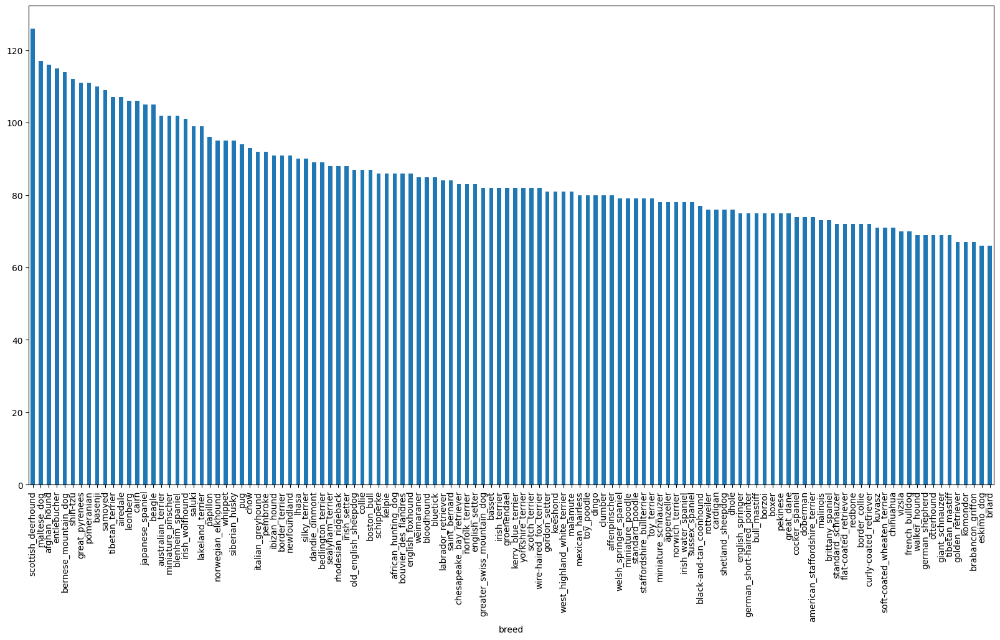

In [3]:
# How many img are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [4]:
labels_csv["breed"].value_counts().median()

82.0

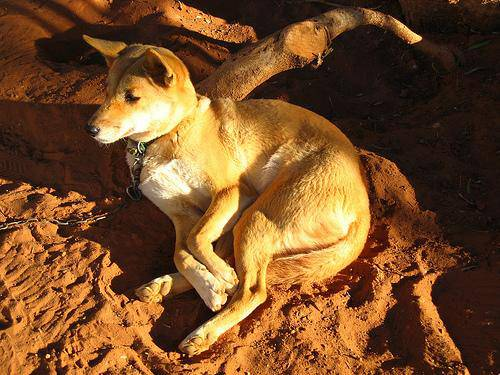

In [5]:
# To view an img
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [6]:
# Creat pathnames from image ids
filename = ["/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

filename[:10]

['/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 

In [7]:
# Chech wheather the number of filesnames match number of actual image file
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/")) == len(filename):
  print("Yes")
else:
  print("No")


Yes


# Sinces we now got our training image filepath in a list, let's prepare our labels

In [8]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) does the same as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [9]:
len(labels)

10222

In [10]:
# See if the number of labels matchs the number of filenames
if len(labels) == len(filename):
  print("YES")
else:
  print("NO")

YES


In [11]:
# Find the unique label values
unique_breeda = np.unique(labels)
unique_breeda

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [12]:
len(unique_breeda)

120

In [13]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeda

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [14]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeda for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [15]:
import numpy as np
print(labels[0]) # original label
print(np.where(unique_breeda == labels[0])) # Index where labels occurs
print(boolean_labels[0].argmax()) #index where labels occers in boolean array
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Creating our own validation set


In [16]:
# Set uo X and y variables

X = filename
y = boolean_labels


we're going to start off with ~1000 images and increase as needed

In [17]:
# Set number of images to use for experement
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000,step:1000}

In [18]:
# Lets split out data in train and validation set
from sklearn.model_selection import train_test_split

# Split them into training and valitation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train),len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [19]:
# Lets just have a geez at the training data
X_train[:5], y_train[:1]

(['/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
       

# Preprocessing images(turning images into Tensors)
To preprocess our images into tensors we're going to write a function which does a few things:
1. Take am image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image(convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

Before we do, lets see what importing an image looks like

In [20]:
# Convert img to numpy array
from matplotlib.pyplot import imread

image = imread(filename[42])
image.shape

(257, 350, 3)

In [21]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
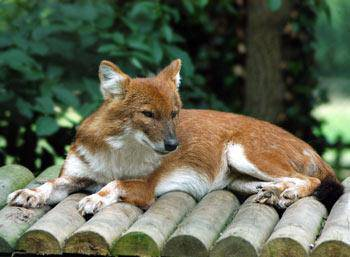

In [22]:
image

In [23]:
# Turn img to tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [24]:
IMG_SIZE = 224

# Create a function for preprocessing image
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path as input and turns the image into Tesor
  """

  # Read in am image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels(RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value(224,224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning our data into batches

- why turn our data into batchs?
> let's say you are trying to process 10,000+ imgs in one go .... they all might not fit into memory

So that's why we do about 32 images at a time

- In order to use TensorFlow effectively, we need our data inthe form of Tensor tuples which look like this : `(image, label)`

In [25]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
    """
    Takes an image file path name and the assosiated label, processes the image and returns a typle of (image, label).
    """
    image = process_image(image_path)
    return image, label

In [92]:
# Define the batch size ,32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's traiing data but doesn't shuffle it is id validation data
  Also accepts test data as input (no labels)
  """

  # If the data is a test data, We do not have th elabels
  if test_data:
    print("Creating test data bathes...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only file paths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we do not need to shuffke it
  elif valid_data:
    print("Creating validation data batch...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batchs...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # Shufflling pathnames and labels befor mapping images processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    #Create (image, label) tuples (this also turns the image path into a preprocesseed image)
    data = data.map(get_image_label)

    # Turn the training data into batchs
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [27]:
# Create training and validation data batchs
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batchs...
Creating validation data batch...


In [28]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches
- our data is now in batchs, however these can be a littel heard to uderstand, lets visualize the batchs

In [29]:
import matplotlib.pyplot as plt

# Create a fuction tfor viewing image in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (For displaying 25 images)
  for i in range(25):
    # Create a subplot (5 X 5)
    ax = plt.subplot(5, 5, i+1)
    # DisplY n image
    plt.imshow(images[i])
    # Add the image label
    plt.title(unique_breeda[labels[i].argmax()])
    # Turn off the grig lines
    ax.axis("off") # Corrected from plt.axes("off")

In [30]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [31]:
# Every time we run this the data will be shufeld
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[1.28298521e-01, 1.28298521e-01, 3.57804075e-02],
          [1.15830407e-01, 1.24511845e-01, 2.85475198e-02],
          [2.04522759e-01, 2.20209032e-01, 1.27227008e-01],
          ...,
          [9.96078491e-01, 9.96078491e-01, 9.96078491e-01],
          [9.96078491e-01, 9.96078491e-01, 9.96078491e-01],
          [9.96078491e-01, 9.96078491e-01, 9.96078491e-01]],
 
         [[1.09268077e-01, 9.89981890e-02, 3.66638787e-02],
          [1.36334240e-01, 1.32523015e-01, 7.19875544e-02],
          [5.91352820e-01, 6.00994706e-01, 5.29973269e-01],
          ...,
          [9.96078491e-01, 9.96078491e-01, 9.96078491e-01],
          [9.96078491e-01, 9.96078491e-01, 9.96078491e-01],
          [9.96078491e-01, 9.96078491e-01, 9.96078491e-01]],
 
         [[1.74276859e-01, 1.57583475e-01, 1.47752360e-01],
          [1.58805311e-01, 1.40351519e-01, 1.21537432e-01],
          [2.30892688e-01, 2.26719603e-01, 1.98872998e-01],
          ...,
          [9.96078491e-01, 9.96078491e-01, 9.9607

In [32]:
len(train_images), len(train_labels)

(32, 32)

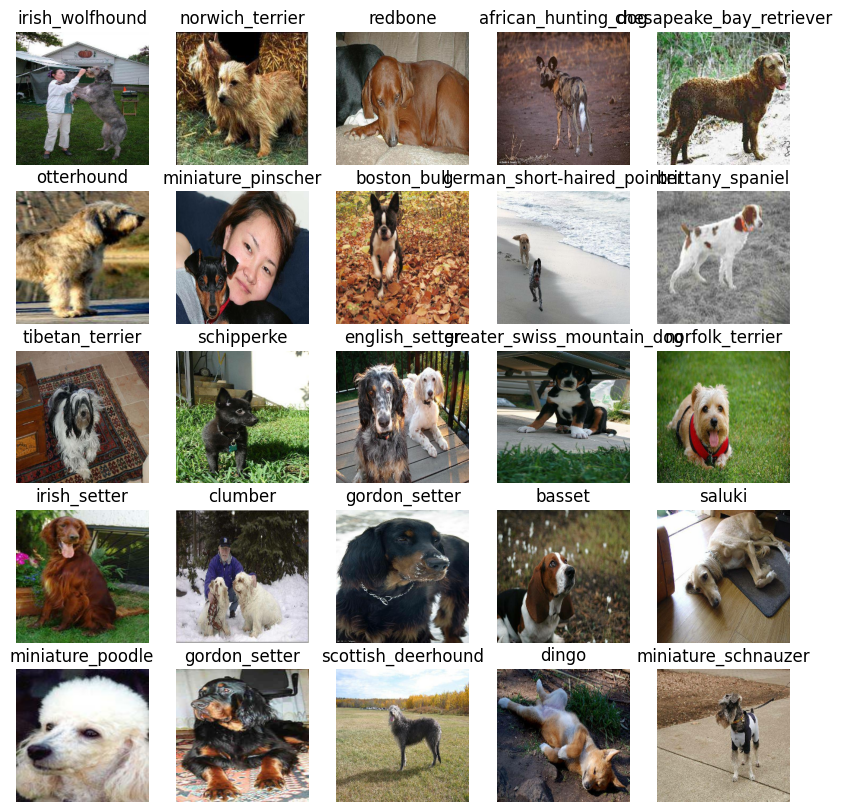

In [33]:
# Now lets visualize the data in a training batch
show_25_images(train_images,train_labels)

In [34]:
# Now lets do for validation set

In [35]:
val_images, val_labels = next(train_data.as_numpy_iterator())
val_images, val_labels

(array([[[[4.10442948e-01, 5.04560590e-01, 4.18286085e-01],
          [4.17690843e-01, 5.11808515e-01, 4.25533980e-01],
          [4.24913675e-01, 5.19031286e-01, 4.32756811e-01],
          ...,
          [5.56232572e-01, 6.35294139e-01, 6.27451003e-01],
          [5.35337865e-01, 6.09847665e-01, 6.02004528e-01],
          [5.23984551e-01, 5.98494351e-01, 5.90651214e-01]],
 
         [[3.99939477e-01, 4.94057119e-01, 4.07782614e-01],
          [4.07160401e-01, 5.01278043e-01, 4.15003538e-01],
          [4.15602297e-01, 5.09719908e-01, 4.23445433e-01],
          ...,
          [5.56192338e-01, 6.31017208e-01, 6.23489201e-01],
          [5.32738090e-01, 6.07247889e-01, 5.99404752e-01],
          [5.22451997e-01, 5.96961796e-01, 5.89118659e-01]],
 
         [[3.91885519e-01, 4.86003160e-01, 3.99728656e-01],
          [3.96717459e-01, 4.90835100e-01, 4.04560596e-01],
          [4.05470967e-01, 4.99588609e-01, 4.13314104e-01],
          ...,
          [5.52626073e-01, 6.27451003e-01, 6.1992

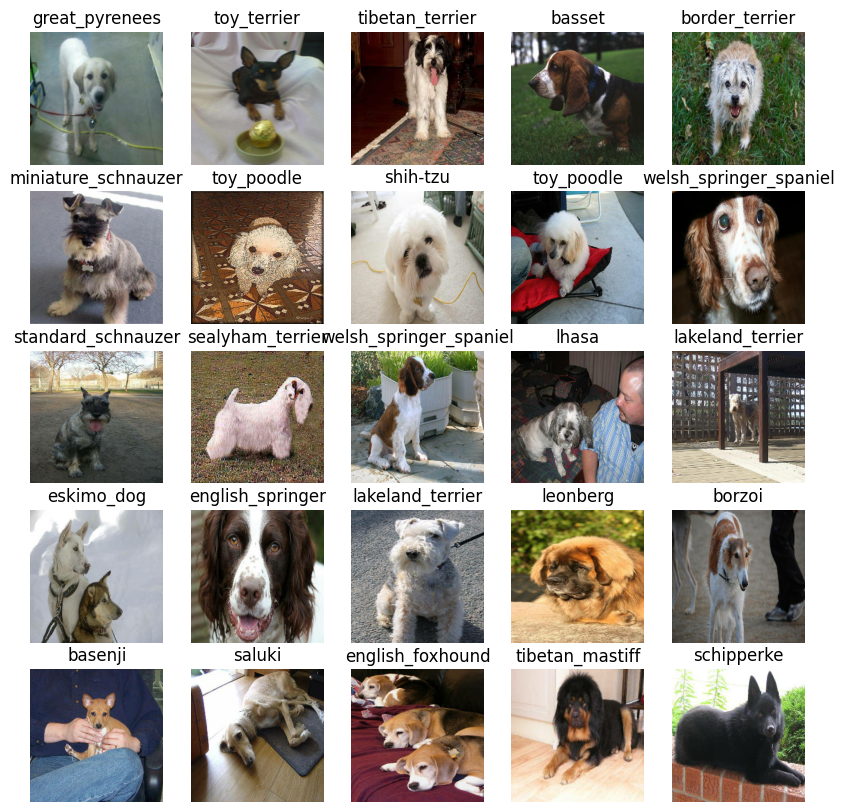

In [36]:
# Now lets visualize the data in a training batch
show_25_images(val_images,val_labels)

# Building a model
Before we build a model, there are a few things we need to define:
- The input shape(our images shape, in the form of tensorr) to our model
- The output shape(image labels, in the form of tensors) of our model.
- The URL of the model we want to use.

import tensorflow_hub as hub


m = tf.keras.Sequential([
    hub.KerasLayer("https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1")
])



m.build([None, 224, 224, 3])  # Batch input shape.


In [37]:
# Set uo input shape to the model
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE, 3] #batch, height, with, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeda)

# Setup model URL from TensorFow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Now we've got out inputs, outputs and model ready to go let's put them togather into a keras deep learning model!

Knowing this, lets create a function which:
- takes the input shape, output shape and the model we've got chosen as parameters.
- Defines the layer in a keras model in sequential fashion (do this forst, then this, then that)
- Compiles the model (says how it should be evaluated and improved)
- Builds the model (tells the model the input shape it'll be getting).
- Returns the model.

In [38]:
# Creat a funv=ction that builda a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1(input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalFocalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [39]:
#model = create_model()
#model.summary()

In [40]:
import tensorflow as tf

INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
OUTPUT_SHAPE = len(unique_breeda)

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE):
    print("Building MobileNetV2 model")

    base_model = tf.keras.applications.MobileNetV2(
        input_shape=input_shape,
        include_top=False,
        weights="imagenet"
    )
    base_model.trainable = False

    model = tf.keras.Sequential([
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(output_shape, activation="softmax")
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(),
        loss=tf.keras.losses.CategoricalFocalCrossentropy(),
        metrics=["accuracy"]
    )
    return model

In [41]:
model = create_model()
model.summary()

Building MobileNetV2 model
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

# Creating Callbacks
- callbacks are hepler functions a model can use during training to do such things as save its progress, check its progress or stop training early is a model stops improving
- we'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long

## TensorBoard callback
To setup a TensorBoard callback, we need to do 3 things:
1. Load the tensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our models training loga with the `%tensorboard` magic function(after model training)

In [42]:
# Lode the TensorBord notebook extension
%load_ext tensorboard

In [43]:
import datetime

# Create a function to build a Tensorboard callback
def create_tensorbord_callback():
  # Create a log directory for storing TensorBord loges
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/logs",
                        # Make it do the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

# Early stoping Callback

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

Early stoping our model from overfiting by stoping training if a ccertain evaluation metric stops improveing.

In [44]:
# Create a early stop callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [45]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

## Let's create a function which trains a model.

- Create a model using `create_model()`
- Setup a Tesorboard callback `create_tensorbord_callback()`
- Call the `fit()` functionon our model passing it the data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we;d like to use
- Return the model

In [46]:
from sklearn.utils.validation import validate_data
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new TensorBord session everytime we train a model
  tensorboard = create_tensorbord_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  #Return the fitted model
  return model

In [47]:
# Fit the model to the data
model = train_model()

Building MobileNetV2 model
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 240s 8s/step - accuracy: 0.0420 - loss: 1.2010 - val_accuracy: 0.2500 - val_loss: 0.8066
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - accuracy: 0.5860 - loss: 0.4537 - val_accuracy: 0.4250 - val_loss: 0.4794
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 182ms/step - accuracy: 0.9066 - loss: 0.1175 - val_accuracy: 0.5400 - val_loss: 0.3620
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - accuracy: 0.9913 - loss: 0.0375 - val_accuracy: 0.5550 - val_loss: 0.3354
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 258ms/step - accuracy: 0.9981 - loss: 0.0174 - val_accuracy: 0.5700 - val_loss: 0.3213
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 213ms/step - accuracy: 0.9999 - loss: 0.0099 - val_accuracy: 0.5750 - val_loss: 0.3151
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 227ms/step - accuracy: 1.0000 - loss: 0.0073 - val_accuracy: 0.5800 - val_loss: 0.3100
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 282ms/step - accuracy: 1.00

# Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directly we created earlier and visualize its contents.

In [48]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/dog-breed-identification/logs

<IPython.core.display.Javascript object>

In [49]:
# Make predictions on the validation data (Not. used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step


array([[2.0634334e-03, 4.2318436e-03, 2.1882640e-04, ..., 3.3702329e-04,
        4.6103905e-04, 5.8225035e-03],
       [3.6292106e-03, 6.8908057e-04, 8.6111752e-03, ..., 5.0888222e-04,
        8.0589317e-03, 6.3280284e-04],
       [1.8558488e-04, 2.4306129e-03, 1.1189879e-04, ..., 2.6762759e-04,
        7.2520583e-05, 6.1352798e-03],
       ...,
       [8.4879022e-04, 4.9911104e-03, 4.8300109e-04, ..., 1.2302939e-03,
        1.3563305e-04, 7.0306705e-04],
       [2.1747784e-03, 6.9426518e-04, 6.8346382e-04, ..., 2.5577605e-04,
        3.6110642e-04, 4.4665575e-02],
       [1.2416909e-03, 8.4540370e-05, 6.6229899e-04, ..., 5.0716259e-04,
        7.0791872e-04, 2.3090503e-04]], dtype=float32)

In [50]:
predictions.shape

(200, 120)

In [51]:
# First prediction
index = 42
print(predictions[index])
print(f"Max Value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeda[np.argmax(predictions[index])]}")

[1.92174222e-04 2.78626656e-04 3.91699607e-04 3.39069578e-04
 3.58110387e-03 2.02815427e-04 2.66492534e-05 1.20861568e-02
 2.50779949e-02 2.69560982e-02 2.20129295e-04 4.40154079e-04
 4.26515384e-04 8.89281556e-03 1.84626388e-03 2.45326804e-03
 3.87600521e-05 5.96485334e-04 8.13119987e-04 2.32424936e-03
 3.69089539e-05 8.81146453e-03 4.72495230e-05 3.68595029e-05
 6.55809510e-03 5.77999162e-04 3.25379642e-06 2.36066320e-04
 5.66456816e-04 2.25661788e-04 3.07073169e-05 5.09967176e-05
 2.82652545e-05 1.65370933e-04 9.61494879e-05 2.08946512e-05
 5.93976292e-04 2.58094119e-03 4.10248358e-05 2.63086915e-01
 1.64027995e-04 6.23563119e-06 1.10937585e-03 4.27470195e-06
 5.14364336e-04 8.71707089e-05 3.32147378e-04 1.33593823e-03
 4.78507718e-05 1.33244810e-03 8.16110478e-05 8.32306832e-05
 4.30762768e-04 2.38811877e-03 4.24903737e-05 3.91347706e-03
 1.71204458e-03 5.26041142e-04 2.10229817e-04 2.63184647e-05
 3.48935981e-04 5.50768513e-04 4.32149182e-06 5.49451179e-05
 4.29384236e-05 9.578189

Having the above functionality is great but we waht to be able to do it at scale

- And it would be better if we could see the image the prediction is being made on

- prediction probabilities are also known as confidence levels

In [52]:
# Tuen prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into label.
  """
  return unique_breeda[np.argmax(prediction_probabilities)]


# Geet a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[22])
pred_label

'australian_terrier'

In [53]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [54]:
# create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeda[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get labels:
- Prediction labels
- validation labels(truth labels)
- Validation images

Lets make some function to make these all a bit more visauize.

We'll create a function which:
- Takes an array of prediction probabilitys, an array of truth labels and an array of images and an integers.
- Convert the prediction probabilities to a predicted label.
- Plot the predicted label, its predicted probability, the truth label and the traget image on a single plot.

In [55]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wroung
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

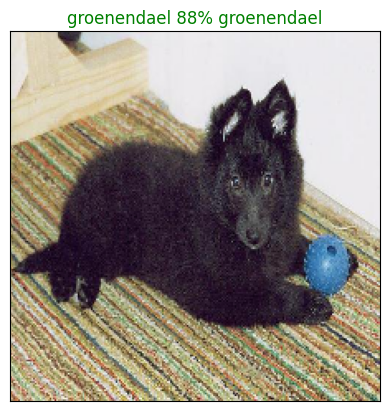

In [56]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)


# Plot the top 10 prediction probability valus and labels, coloring the true label green


In [57]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plots the top 10 highest prediction confidences along with the true label
    for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get predicted label
    pred_label = get_pred_label(pred_prob)

    # Top 10 predictions
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    top_10_pred_labels = unique_breeda[top_10_pred_indexes]

    # Plot
    plt.figure(figsize=(10, 5))
    bars = plt.bar(
        np.arange(len(top_10_pred_labels)),
        top_10_pred_values,
        color="grey"
    )

    plt.xticks(
        np.arange(len(top_10_pred_labels)),
        labels=top_10_pred_labels,
        rotation=90
    )

    plt.ylabel("Prediction Probability")
    plt.title(f"True: {true_label} | Predicted: {pred_label}")

    # Color true label green
    if true_label in top_10_pred_labels:
        bars[np.where(top_10_pred_labels == true_label)[0][0]].set_color("green")

    # Color predicted label red (if different)
    if pred_label in top_10_pred_labels and pred_label != true_label:
        bars[np.where(top_10_pred_labels == pred_label)[0][0]].set_color("red")

    plt.show()


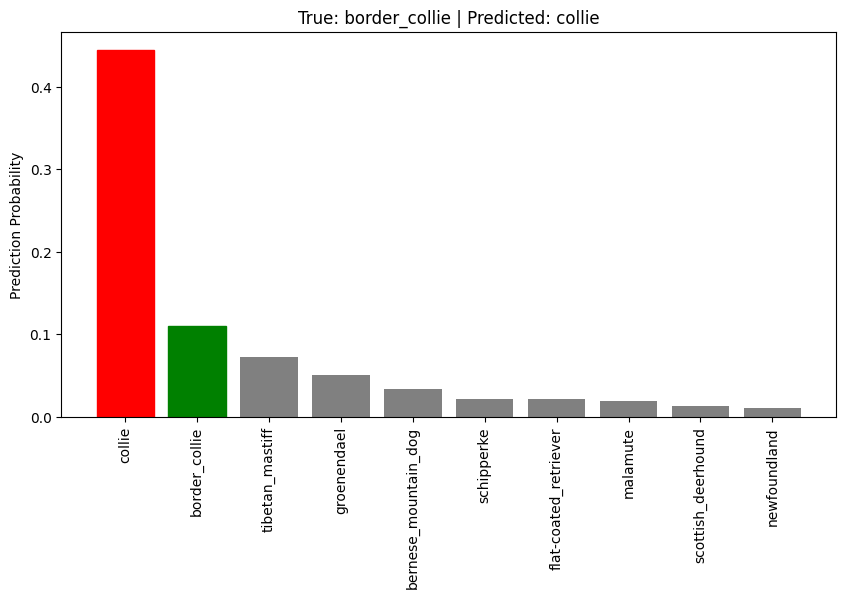

In [58]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

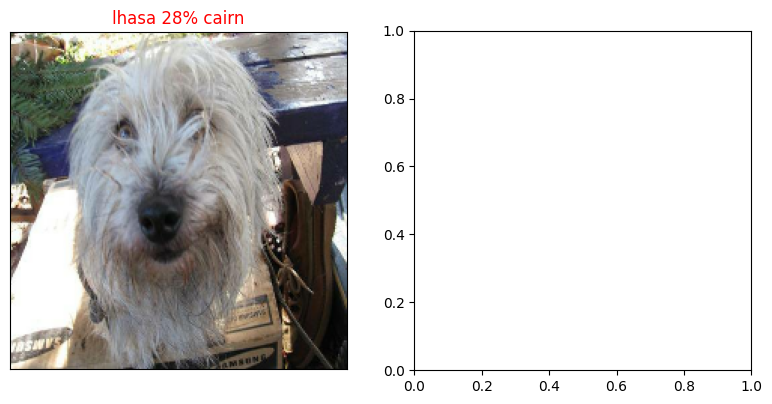

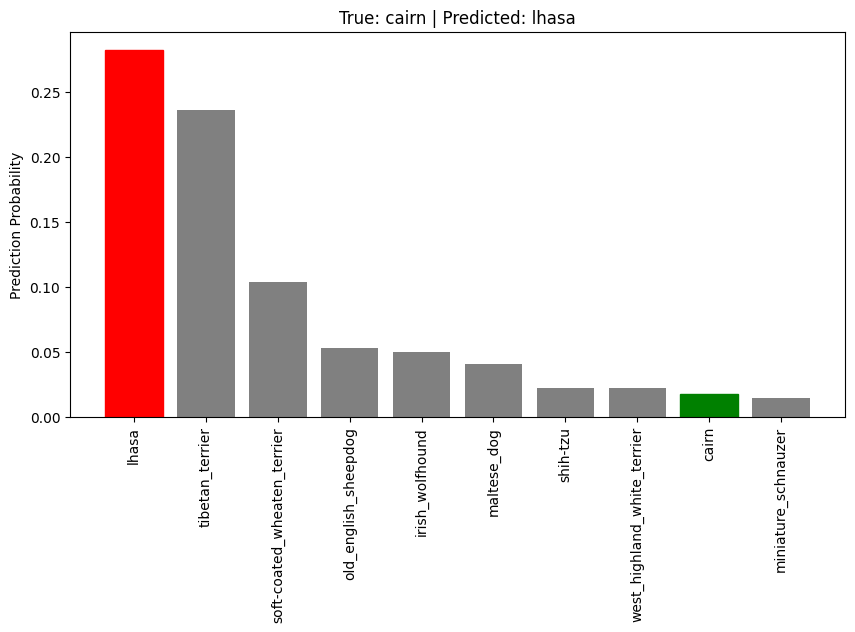

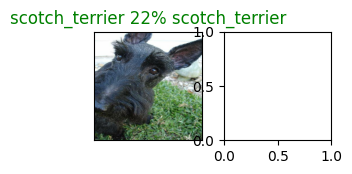

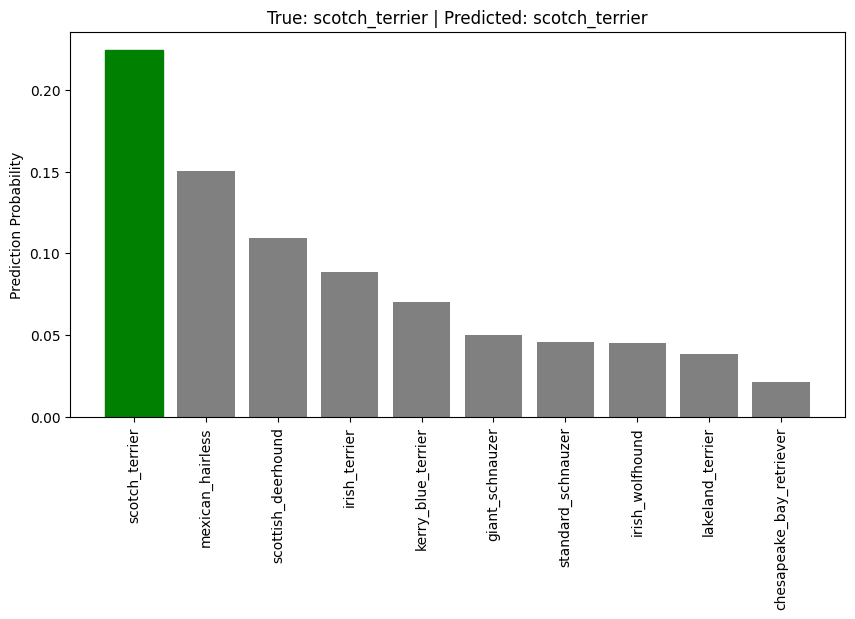

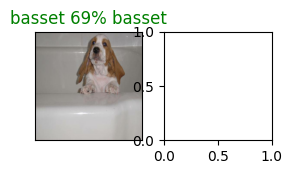

...

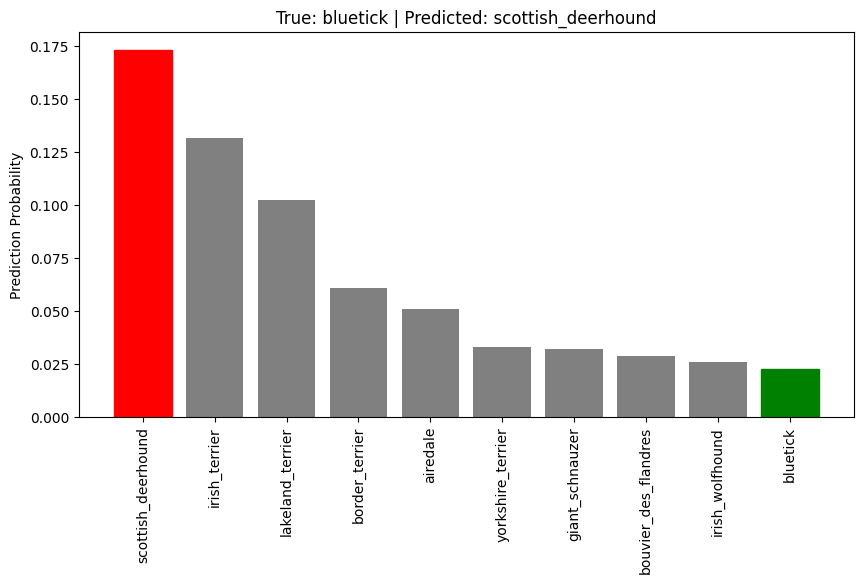

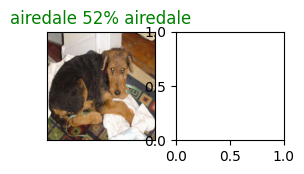

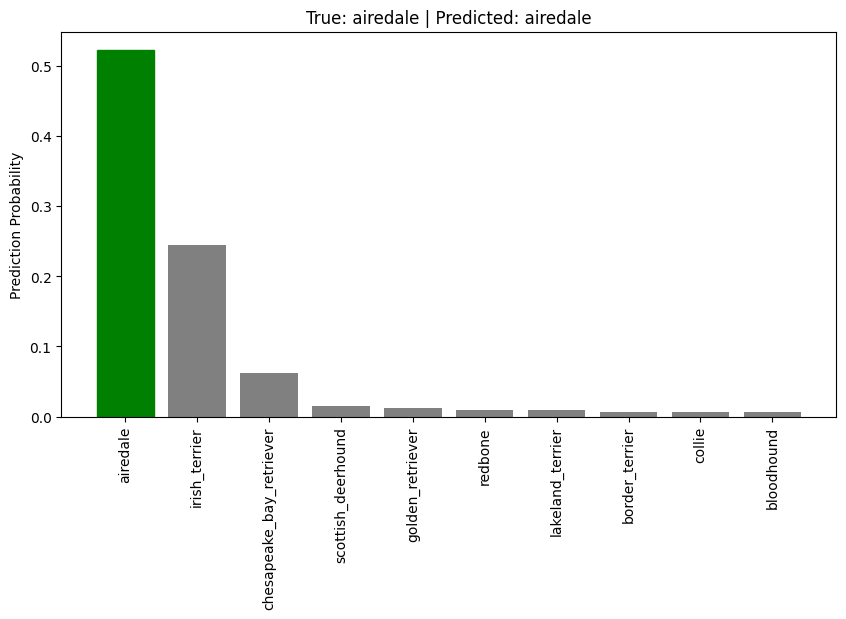

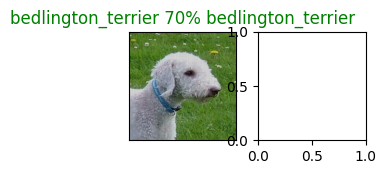

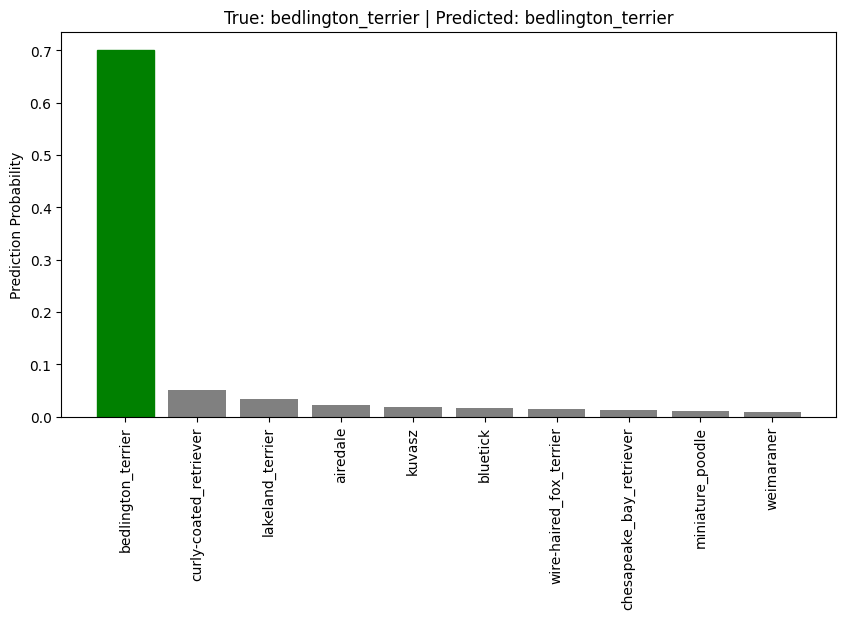

<Figure size 640x480 with 0 Axes>

In [66]:
# Lets check out a few predictiond and their different values
i_multiplier = 0
num_rows = 3
num_cols =2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)



plt.tight_layout(h_pad=1.0)
plt.show()

# Save the model

In [67]:
# Creae a function to save a model
def save_model(model,suffix=None):
  """
  Savels a given model in a models directory and appends a sufix(string)
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #Save format of model
  print(f"Saveing model to {model_path}")
  model.save(model_path)
  return model_path

In [72]:
# Create a function to load model
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """
    print(f"Loading saved model from: {model_path}")

    model = tf.keras.models.load_model(
        model_path,
        custom_objects={"KerasLayer": hub.KerasLayer}
    )

    return model


In [70]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-image-mobilenetv2-Adam")

Saveing model to /content/drive/MyDrive/Colab Notebooks/dog-breed-identification/Models/20251226-05331766727215-1000-image-mobilenetv2-Adam.h5


'/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/Models/20251226-05331766727215-1000-image-mobilenetv2-Adam.h5'

In [73]:
# Lode the trained model
lodeed_1000_image_model = load_model('/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/Models/20251226-05331766727215-1000-image-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/dog-breed-identification/Models/20251226-05331766727215-1000-image-mobilenetv2-Adam.h5


In [74]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - accuracy: 0.5947 - loss: 0.2934


[0.3035784959793091, 0.5799999833106995]

In [75]:
# Evaluate the mloded model
lodeed_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 636ms/step - accuracy: 0.5947 - loss: 0.2934


[0.3035784959793091, 0.5799999833106995]

# Training on full dataset 🐶

In [77]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

Creating training data batchs...


In [78]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [79]:
# Create a model for full model
full_model = create_model()

Building MobileNetV2 model


In [81]:
# Create full model callbacks
full_model_tensorboard = create_tensorbord_callback()
# No Validation set when we are training on all the data, so we can't moniter validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [83]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])


Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 64s 171ms/step - accuracy: 0.4488 - loss: 0.5427
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 183ms/step - accuracy: 0.8392 - loss: 0.0770
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 67s 136ms/step - accuracy: 0.9167 - loss: 0.0379
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 136ms/step - accuracy: 0.9502 - loss: 0.0207
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - accuracy: 0.9749 - loss: 0.0121
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 136ms/step - accuracy: 0.9904 - loss: 0.0066
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 139ms/step - accuracy: 0.9958 - loss: 0.0044
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - accuracy: 0.9971 - loss: 0.0033
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - accuracy: 0.9985 - loss: 0.0024
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 136ms/step - accuracy: 0.9983 - loss: 0.0020
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 137ms/step - accuracy: 0.9987 - loss: 0.0016
Epoch 12

In [84]:
save_model(full_model, suffix="full-image-set")

Saveing model to /content/drive/MyDrive/Colab Notebooks/dog-breed-identification/Models/20251226-06121766729536-full-image-set.h5


'/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/Models/20251226-06121766729536-full-image-set.h5'

In [86]:
# Lode in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/Models/20251226-06121766729536-full-image-set.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/dog-breed-identification/Models/20251226-06121766729536-full-image-set.h5


# Lode the test images filemanes

In [95]:
test_path = "/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:5]

['/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/test/e5ad4cc7818e4eed04d209da177afa6f.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/test/e0d85c8c8730c81e80ff2ca74bb61c87.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/test/df2ce797bf398414aac7e20119c17cb6.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/test/e200fe397f6ca5d626210830fc38aca9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/test/df2a003a0b1a216effd806f03f703859.jpg']

In [96]:
len(test_filenames)

10357

In [97]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data bathes...


In [98]:
from re import VERBOSE
# Make predictions on the test data batch using the loded dull model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 286s 847ms/step


In [99]:
# Save predictions (numpy array) to csv file (for acces later)
np.savetxt("/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/preds_array.csv", test_predictions, delimiter=",")

In [100]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/dog-breed-identification/preds_array.csv",delimiter=",")

In [101]:
test_predictions[:10]

array([[3.32085115e-08, 8.48867572e-08, 2.72243451e-05, ...,
        8.48656327e-06, 1.60404966e-06, 2.18987634e-06],
       [4.88034220e-06, 1.90847677e-05, 1.62464517e-06, ...,
        3.60574774e-07, 3.04799119e-06, 3.28830974e-05],
       [1.35288929e-05, 1.62783886e-09, 4.67541952e-08, ...,
        2.86279119e-05, 2.10171791e-07, 3.23201391e-07],
       ...,
       [1.30213271e-08, 1.99329969e-10, 1.48092397e-07, ...,
        9.47133885e-05, 5.24526422e-06, 8.70331220e-08],
       [1.20072583e-08, 1.17706533e-09, 9.18032356e-07, ...,
        2.35804509e-06, 2.78915255e-08, 1.17021511e-06],
       [5.12776310e-09, 5.18602349e-12, 1.85639126e-09, ...,
        3.86858374e-05, 9.30379372e-07, 6.46915836e-08]])

In [102]:
test_predictions.shape

(10357, 120)